# **IMPORT LIBRARIES**

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# Deep Learning Libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import EfficientNetB0, ResNet50, VGG16
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

# Image Processing
from tensorflow.keras.preprocessing import image
import cv2

# Utilities
import os
import zipfile
from glob import glob
from sklearn.metrics import classification_report, confusion_matrix
import plotly.express as px
import plotly.graph_objects as go

print("TensorFlow Version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

TensorFlow Version: 2.19.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


# **EXTRACT DATASETS**

In [2]:
!ls

sample_data  seg_pred.zip  seg_test.zip  seg_train.zip


In [3]:
!unzip seg_pred.zip
!unzip seg_test.zip
!unzip seg_train.zip

Streaming output truncated to the last 5000 lines.
  inflating: seg_train/mountain/7539.jpg  
  inflating: seg_train/mountain/7551.jpg  
  inflating: seg_train/mountain/7560.jpg  
  inflating: seg_train/mountain/7565.jpg  
  inflating: seg_train/mountain/7578.jpg  
  inflating: seg_train/mountain/7581.jpg  
  inflating: seg_train/mountain/7586.jpg  
  inflating: seg_train/mountain/7647.jpg  
  inflating: seg_train/mountain/7652.jpg  
  inflating: seg_train/mountain/7654.jpg  
  inflating: seg_train/mountain/7662.jpg  
  inflating: seg_train/mountain/767.jpg  
  inflating: seg_train/mountain/7672.jpg  
  inflating: seg_train/mountain/7679.jpg  
  inflating: seg_train/mountain/7681.jpg  
  inflating: seg_train/mountain/7693.jpg  
  inflating: seg_train/mountain/7695.jpg  
  inflating: seg_train/mountain/7698.jpg  
  inflating: seg_train/mountain/7700.jpg  
  inflating: seg_train/mountain/771.jpg  
  inflating: seg_train/mountain/7715.jpg  
  inflating: seg_train/mountain/7744.jpg  
  inf

In [4]:
!ls

sample_data  seg_pred.zip  seg_test.zip  seg_train.zip
seg_pred     seg_test	   seg_train


In [5]:
!ls seg_train

buildings  forest  glacier  mountain  sea  street


In [6]:
!ls seg_test

buildings  forest  glacier  mountain  sea  street


In [7]:
!ls seg_pred

10004.jpg  13296.jpg  16412.jpg  19543.jpg  22613.jpg  3947.jpg  6943.jpg
10005.jpg  13297.jpg  16415.jpg  19549.jpg  22615.jpg  3953.jpg  6948.jpg
10012.jpg  13299.jpg  16424.jpg  19557.jpg  22618.jpg  3962.jpg  6950.jpg
10013.jpg  132.jpg    16428.jpg  19558.jpg  22621.jpg  3966.jpg  6951.jpg
10017.jpg  13302.jpg  16429.jpg  19560.jpg  22622.jpg  3970.jpg  6952.jpg
10021.jpg  13303.jpg  16436.jpg  19561.jpg  22627.jpg  3975.jpg  6957.jpg
10034.jpg  13305.jpg  16442.jpg  19562.jpg  22630.jpg  3976.jpg  695.jpg
10038.jpg  1330.jpg   16444.jpg  19564.jpg  22638.jpg  3979.jpg  6964.jpg
1003.jpg   13316.jpg  16445.jpg  19568.jpg  22641.jpg  3981.jpg  6965.jpg
10040.jpg  13318.jpg  16446.jpg  19569.jpg  22649.jpg  3982.jpg  6966.jpg
10043.jpg  13321.jpg  16447.jpg  19570.jpg  22651.jpg  3983.jpg  6974.jpg
10045.jpg  13325.jpg  16449.jpg  19572.jpg  22658.jpg  3986.jpg  6980.jpg
10047.jpg  13326.jpg  1644.jpg	 19575.jpg  22659.jpg  3987.jpg  6988.jpg
10048.jpg  13329.jpg  16454.jpg  19577.j

In [8]:
train_dir = '/content/seg_train'
test_dir  = '/content/seg_test'
pred_dir  = '/content/seg_pred'

In [9]:
print("\n" + "="*70)
print("DIRECTORY STRUCTURE")
print("="*70)
print(f"Training Directory: {train_dir}")
print(f"Testing Directory: {test_dir}")
print(f"Prediction Directory: {pred_dir}")


DIRECTORY STRUCTURE
Training Directory: /content/seg_train
Testing Directory: /content/seg_test
Prediction Directory: /content/seg_pred


# **EXPLORATORY DATA ANALYSIS (EDA)**

In [10]:
print("\n" + "="*70)
print("EXPLORATORY DATA ANALYSIS")
print("="*70)

# Get class names
classes = sorted(os.listdir(train_dir))
print(f"\nClasses Found: {classes}")
print(f"Number of Classes: {len(classes)}")

# Count images in each class
train_counts = {}
test_counts = {}

for class_name in classes:
    train_class_path = os.path.join(train_dir, class_name)
    test_class_path = os.path.join(test_dir, class_name)

    train_counts[class_name] = len(os.listdir(train_class_path))
    test_counts[class_name] = len(os.listdir(test_class_path))

# Create DataFrame
data_summary = pd.DataFrame({
    'Class': classes,
    'Training Images': [train_counts[c] for c in classes],
    'Testing Images': [test_counts[c] for c in classes]
})
data_summary['Total Images'] = data_summary['Training Images'] + data_summary['Testing Images']

print("\n" + "="*70)
print("DATASET SUMMARY")
print("="*70)
print(data_summary)
print(f"\nTotal Training Images: {data_summary['Training Images'].sum()}")
print(f"Total Testing Images: {data_summary['Testing Images'].sum()}")
print(f"Total Images: {data_summary['Total Images'].sum()}")


EXPLORATORY DATA ANALYSIS

Classes Found: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Number of Classes: 6

DATASET SUMMARY
       Class  Training Images  Testing Images  Total Images
0  buildings             2191             437          2628
1     forest             2271             474          2745
2    glacier             2404             553          2957
3   mountain             2512             525          3037
4        sea             2274             510          2784
5     street             2382             501          2883

Total Training Images: 14034
Total Testing Images: 3000
Total Images: 17034


# VISUALIZATION 1: Class Distribution

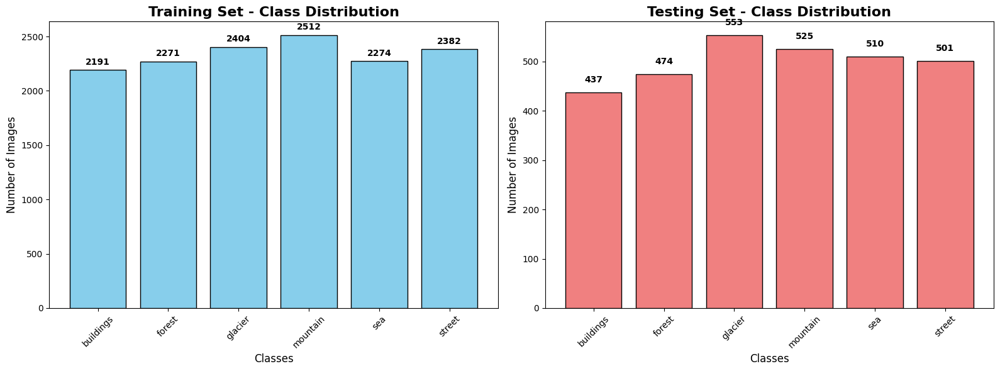

In [11]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Training set distribution
axes[0].bar(classes, [train_counts[c] for c in classes], color='skyblue', edgecolor='black')
axes[0].set_title('Training Set - Class Distribution', fontsize=16, fontweight='bold')
axes[0].set_xlabel('Classes', fontsize=12)
axes[0].set_ylabel('Number of Images', fontsize=12)
axes[0].tick_params(axis='x', rotation=45)
for i, v in enumerate([train_counts[c] for c in classes]):
    axes[0].text(i, v + 50, str(v), ha='center', fontweight='bold')

# Testing set distribution
axes[1].bar(classes, [test_counts[c] for c in classes], color='lightcoral', edgecolor='black')
axes[1].set_title('Testing Set - Class Distribution', fontsize=16, fontweight='bold')
axes[1].set_xlabel('Classes', fontsize=12)
axes[1].set_ylabel('Number of Images', fontsize=12)
axes[1].tick_params(axis='x', rotation=45)
for i, v in enumerate([test_counts[c] for c in classes]):
    axes[1].text(i, v + 20, str(v), ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

# VISUALIZATION 2: Sample Images from Each Class

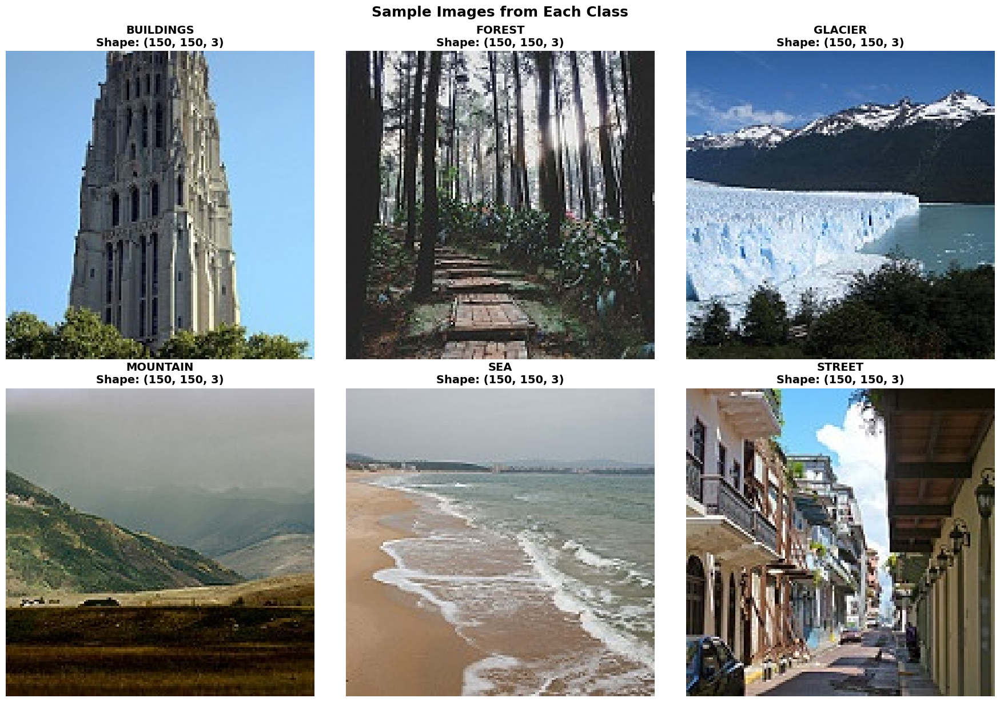

In [12]:
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.ravel()

for idx, class_name in enumerate(classes):
    class_path = os.path.join(train_dir, class_name)
    sample_img_path = os.path.join(class_path, os.listdir(class_path)[0])

    img = cv2.imread(sample_img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(img)
    axes[idx].set_title(f'{class_name.upper()}\nShape: {img.shape}',
                        fontsize=14, fontweight='bold')
    axes[idx].axis('off')

plt.tight_layout()
plt.suptitle('Sample Images from Each Class', fontsize=18, fontweight='bold', y=1.02)
plt.show()

# VISUALIZATION 3: Multiple Samples from Each Class

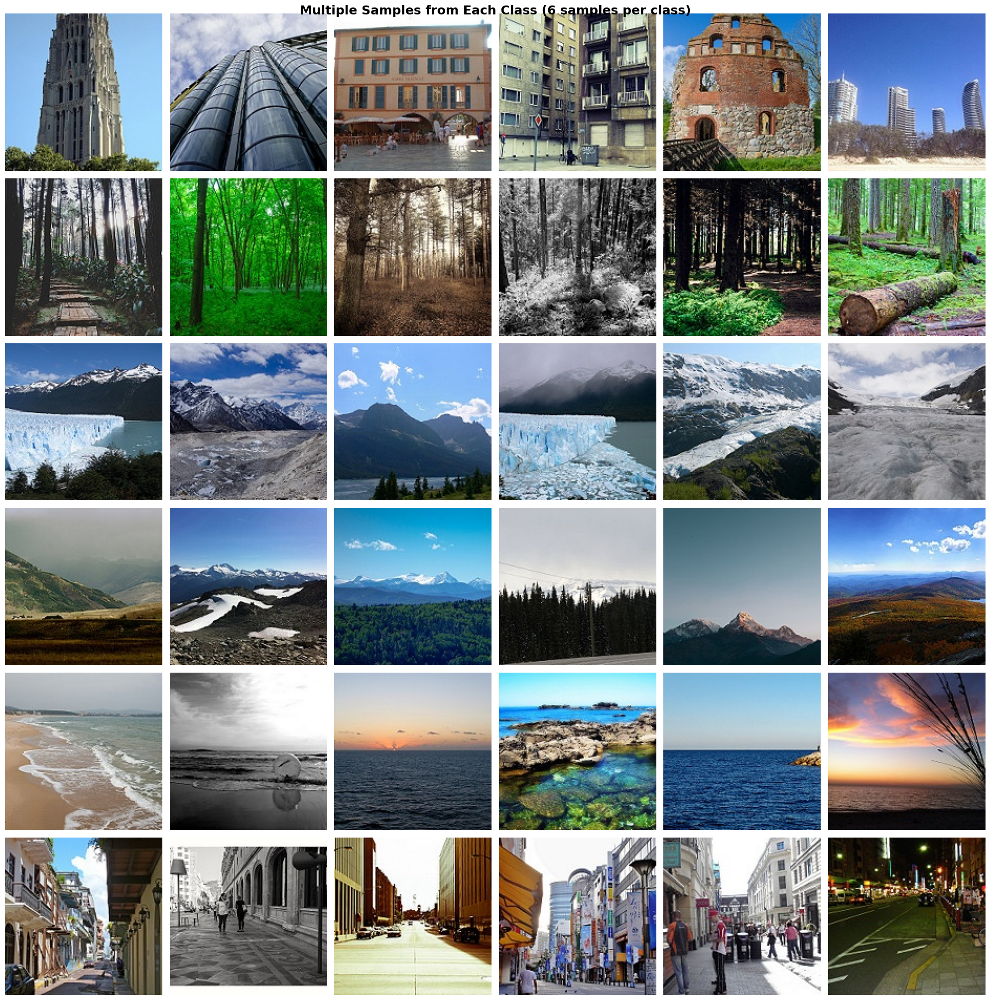

In [13]:
fig, axes = plt.subplots(6, 6, figsize=(20, 20))

for idx, class_name in enumerate(classes):
    class_path = os.path.join(train_dir, class_name)
    sample_images = os.listdir(class_path)[:6]

    for img_idx, img_name in enumerate(sample_images):
        img_path = os.path.join(class_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        axes[idx, img_idx].imshow(img)
        if img_idx == 0:
            axes[idx, img_idx].set_ylabel(class_name.upper(),
                                          fontsize=12, fontweight='bold')
        axes[idx, img_idx].axis('off')

plt.tight_layout()
plt.suptitle('Multiple Samples from Each Class (6 samples per class)',
             fontsize=18, fontweight='bold', y=1.001)
plt.show()

# **DATA PREPROCESSING AND AUGMENTATION**

In [14]:
print("\n" + "="*70)
print("DATA PREPROCESSING & AUGMENTATION")
print("="*70)

# Image parameters
IMG_HEIGHT = 150
IMG_WIDTH = 150
BATCH_SIZE = 32

# Training data generator with augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2  # 20% for validation
)

# Validation and test data generator (only rescaling)
test_datagen = ImageDataGenerator(rescale=1./255)

# Create data generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=True
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

print(f"\n Training samples: {train_generator.samples}")
print(f" Validation samples: {validation_generator.samples}")
print(f" Testing samples: {test_generator.samples}")
print(f" Number of classes: {train_generator.num_classes}")
print(f" Class indices: {train_generator.class_indices}")


DATA PREPROCESSING & AUGMENTATION
Found 11230 images belonging to 6 classes.
Found 2804 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.

 Training samples: 11230
 Validation samples: 2804
 Testing samples: 3000
 Number of classes: 6
 Class indices: {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}


# VISUALIZATION 4: Augmented Images

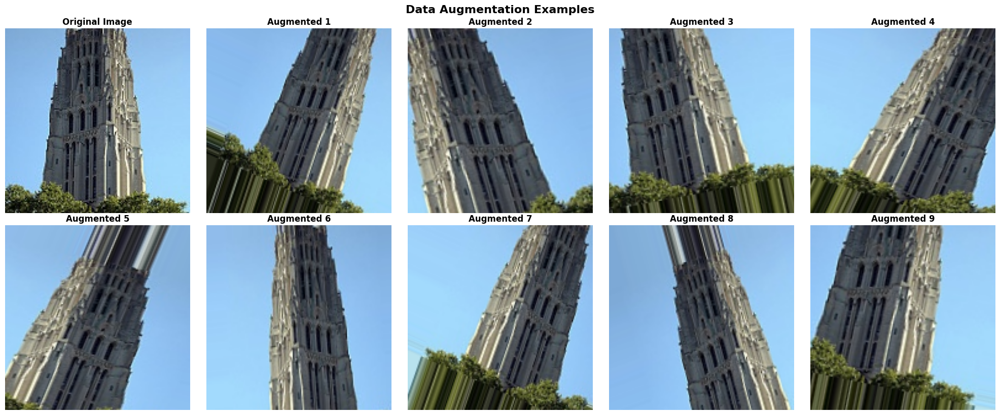

In [15]:
# Show original vs augmented images
sample_class = classes[0]
sample_img_path = os.path.join(train_dir, sample_class, os.listdir(os.path.join(train_dir, sample_class))[0])
sample_img = image.load_img(sample_img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
sample_array = image.img_to_array(sample_img)
sample_array = sample_array.reshape((1,) + sample_array.shape)

fig, axes = plt.subplots(2, 5, figsize=(20, 8))

# Original image
axes[0, 0].imshow(sample_img)
axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

# Generate augmented images
aug_gen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

i = 1
for batch in aug_gen.flow(sample_array, batch_size=1):
    row = i // 5
    col = i % 5
    axes[row, col].imshow(batch[0].astype('uint8'))
    axes[row, col].set_title(f'Augmented {i}', fontsize=12, fontweight='bold')
    axes[row, col].axis('off')
    i += 1
    if i >= 10:
        break

plt.tight_layout()
plt.suptitle('Data Augmentation Examples', fontsize=16, fontweight='bold', y=1.02)
plt.show()

# **MODEL BUILDING - CUSTOM CNN**

In [16]:
print("\n" + "="*70)
print("BUILDING CUSTOM CNN MODEL")
print("="*70)

def create_custom_cnn():
    model = models.Sequential([
        # Block 1
        layers.Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Block 2
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Block 3
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Block 4
        layers.Conv2D(256, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), activation='relu'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),

        # Flatten and Dense layers
        layers.Flatten(),
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(len(classes), activation='softmax')
    ])

    return model

# Create model
model_cnn = create_custom_cnn()

# Compile model
model_cnn.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Model summary
print(model_cnn.summary())


BUILDING CUSTOM CNN MODEL


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 148, 148, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 146, 146, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 146, 146, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 71, 71, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 71, 71, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 69, 69, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 69, 69, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 34, 34, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 34, 34, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 30, 30, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 30, 30, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 15, 15, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 15, 15, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 13, 13, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 13, 13, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 11, 11, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 4,589,350 (17.51 MB)

 Trainable params: 4,585,894 (17.49 MB)

 Non-trainable params: 3,456 (13.50 KB)

None


# **CALLBACKS**

In [17]:
# Early stopping
early_stop = EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

# Reduce learning rate
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=5,
    min_lr=1e-7,
    verbose=1
)

# Model checkpoint
checkpoint = ModelCheckpoint(
    'best_model_cnn.h5',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)


# **TRAIN CUSTOM CNN MODEL**

In [18]:
print("\n" + "="*70)
print("TRAINING CUSTOM CNN MODEL")
print("="*70)

EPOCHS = 50

history_cnn = model_cnn.fit(
    train_generator,
    epochs=EPOCHS,
    validation_data=validation_generator,
    callbacks=[early_stop, reduce_lr, checkpoint],
    verbose=1
)


TRAINING CUSTOM CNN MODEL
Epoch 1/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step - accuracy: 0.3918 - loss: 1.9246
Epoch 1: val_accuracy improved from -inf to 0.20114, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 112s 258ms/step - accuracy: 0.3919 - loss: 1.9237 - val_accuracy: 0.2011 - val_loss: 2.9915 - learning_rate: 0.0010
Epoch 2/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.5537 - loss: 1.1576
Epoch 2: val_accuracy improved from 0.20114 to 0.53103, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 206ms/step - accuracy: 0.5537 - loss: 1.1575 - val_accuracy: 0.5310 - val_loss: 1.2455 - learning_rate: 0.0010
Epoch 3/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.6237 - loss: 1.0133
Epoch 3: val_accuracy did not improve from 0.53103
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.6237 - loss: 1.0132 - val_accuracy: 0.4768 - val_loss: 1.4419 - learning_rate: 0.0010
Epoch 4/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.6596 - loss: 0.9251
Epoch 4: val_accuracy did not improve from 0.53103
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.6596 - loss: 0.9250 - val_accuracy: 0.5068 - val_loss: 1.6498 - learning_rate: 0.0010
Epoch 5/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.6914 - loss: 0.8348
Epoch 5: val_accuracy improved from 0.53103 to 0.59272, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.6914 - loss: 0.8348 - val_accuracy: 0.5927 - val_loss: 1.1105 - learning_rate: 0.0010
Epoch 6/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.7178 - loss: 0.7798
Epoch 6: val_accuracy improved from 0.59272 to 0.60485, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 207ms/step - accuracy: 0.7179 - loss: 0.7798 - val_accuracy: 0.6049 - val_loss: 1.0769 - learning_rate: 0.0010
Epoch 7/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step - accuracy: 0.7302 - loss: 0.7506
Epoch 7: val_accuracy improved from 0.60485 to 0.64979, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 211ms/step - accuracy: 0.7303 - loss: 0.7505 - val_accuracy: 0.6498 - val_loss: 0.9475 - learning_rate: 0.0010
Epoch 8/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.7485 - loss: 0.7045
Epoch 8: val_accuracy improved from 0.64979 to 0.65870, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 206ms/step - accuracy: 0.7485 - loss: 0.7045 - val_accuracy: 0.6587 - val_loss: 1.0680 - learning_rate: 0.0010
Epoch 9/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.7522 - loss: 0.6809
Epoch 9: val_accuracy improved from 0.65870 to 0.73110, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.7522 - loss: 0.6809 - val_accuracy: 0.7311 - val_loss: 0.7735 - learning_rate: 0.0010
Epoch 10/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.7594 - loss: 0.6804
Epoch 10: val_accuracy did not improve from 0.73110
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.7594 - loss: 0.6803 - val_accuracy: 0.7275 - val_loss: 0.8302 - learning_rate: 0.0010
Epoch 11/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.7730 - loss: 0.6329
Epoch 11: val_accuracy improved from 0.73110 to 0.75036, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.7730 - loss: 0.6329 - val_accuracy: 0.7504 - val_loss: 0.6819 - learning_rate: 0.0010
Epoch 12/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step - accuracy: 0.7736 - loss: 0.6279
Epoch 12: val_accuracy improved from 0.75036 to 0.75285, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 74s 210ms/step - accuracy: 0.7736 - loss: 0.6278 - val_accuracy: 0.7529 - val_loss: 0.6865 - learning_rate: 0.0010
Epoch 13/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.7790 - loss: 0.6192
Epoch 13: val_accuracy did not improve from 0.75285
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 207ms/step - accuracy: 0.7790 - loss: 0.6192 - val_accuracy: 0.7104 - val_loss: 0.7960 - learning_rate: 0.0010
Epoch 14/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.7942 - loss: 0.5837
Epoch 14: val_accuracy improved from 0.75285 to 0.80528, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.7942 - loss: 0.5838 - val_accuracy: 0.8053 - val_loss: 0.5317 - learning_rate: 0.0010
Epoch 15/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - accuracy: 0.8014 - loss: 0.5556
Epoch 15: val_accuracy did not improve from 0.80528
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 207ms/step - accuracy: 0.8014 - loss: 0.5556 - val_accuracy: 0.7885 - val_loss: 0.5717 - learning_rate: 0.0010
Epoch 16/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 168ms/step - accuracy: 0.8079 - loss: 0.5732
Epoch 16: val_accuracy did not improve from 0.80528
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 207ms/step - accuracy: 0.8079 - loss: 0.5732 - val_accuracy: 0.7076 - val_loss: 0.7834 - learning_rate: 0.0010
Epoch 17/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8014 - loss: 0.5524
Epoch 17: val_accuracy did not improve from 0.80528
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.8014 - loss: 0.5523 - val_accuracy: 0.7653 - val_loss: 0.6505 - learning_rate: 0.0010
E

351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.8327 - loss: 0.4809 - val_accuracy: 0.8295 - val_loss: 0.4599 - learning_rate: 5.0000e-04
Epoch 21/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.8465 - loss: 0.4477
Epoch 21: val_accuracy did not improve from 0.82953
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.8465 - loss: 0.4477 - val_accuracy: 0.8181 - val_loss: 0.4875 - learning_rate: 5.0000e-04
Epoch 22/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8420 - loss: 0.4433
Epoch 22: val_accuracy did not improve from 0.82953
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.8420 - loss: 0.4433 - val_accuracy: 0.8088 - val_loss: 0.5427 - learning_rate: 5.0000e-04
Epoch 23/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.8455 - loss: 0.4351
Epoch 23: val_accuracy did not improve from 0.82953
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.8455 - loss: 0.4351 - val_accuracy: 0.8285 - val_loss: 0.5072 - learning_ra

351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 216ms/step - accuracy: 0.8446 - loss: 0.4390 - val_accuracy: 0.8573 - val_loss: 0.4066 - learning_rate: 5.0000e-04
Epoch 26/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.8481 - loss: 0.4275
Epoch 26: val_accuracy did not improve from 0.85735
351/351 ━━━━━━━━━━━━━━━━━━━━ 77s 219ms/step - accuracy: 0.8481 - loss: 0.4275 - val_accuracy: 0.8299 - val_loss: 0.4596 - learning_rate: 5.0000e-04
Epoch 27/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.8511 - loss: 0.4135
Epoch 27: val_accuracy did not improve from 0.85735
351/351 ━━━━━━━━━━━━━━━━━━━━ 76s 215ms/step - accuracy: 0.8511 - loss: 0.4136 - val_accuracy: 0.8324 - val_loss: 0.4780 - learning_rate: 5.0000e-04
Epoch 28/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.8517 - loss: 0.4174
Epoch 28: val_accuracy did not improve from 0.85735
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.8517 - loss: 0.4174 - val_accuracy: 0.8320 - val_loss: 0.4694 - learning_ra

351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.8706 - loss: 0.3656 - val_accuracy: 0.8702 - val_loss: 0.3681 - learning_rate: 2.5000e-04
Epoch 32/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.8714 - loss: 0.3566
Epoch 32: val_accuracy did not improve from 0.87019
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.8714 - loss: 0.3566 - val_accuracy: 0.8509 - val_loss: 0.4004 - learning_rate: 2.5000e-04
Epoch 33/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.8730 - loss: 0.3524
Epoch 33: val_accuracy did not improve from 0.87019
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.8730 - loss: 0.3524 - val_accuracy: 0.8680 - val_loss: 0.3751 - learning_rate: 2.5000e-04
Epoch 34/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.8767 - loss: 0.3531
Epoch 34: val_accuracy did not improve from 0.87019
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.8767 - loss: 0.3531 - val_accuracy: 0.8641 - val_loss: 0.3866 - learning_ra

351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.8786 - loss: 0.3375 - val_accuracy: 0.8723 - val_loss: 0.3635 - learning_rate: 2.5000e-04
Epoch 36/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.8827 - loss: 0.3345
Epoch 36: val_accuracy improved from 0.87233 to 0.87874, saving model to best_model_cnn.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.8827 - loss: 0.3345 - val_accuracy: 0.8787 - val_loss: 0.3594 - learning_rate: 2.5000e-04
Epoch 37/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.8685 - loss: 0.3635
Epoch 37: val_accuracy did not improve from 0.87874
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 206ms/step - accuracy: 0.8685 - loss: 0.3635 - val_accuracy: 0.8702 - val_loss: 0.3719 - learning_rate: 2.5000e-04
Epoch 38/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8799 - loss: 0.3238
Epoch 38: val_accuracy did not improve from 0.87874
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.8799 - loss: 0.3238 - val_accuracy: 0.8531 - val_loss: 0.4192 - learning_rate: 2.5000e-04
Epoch 39/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.8814 - loss: 0.3248
Epoch 39: val_accuracy did not improve from 0.87874
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.8814 - loss: 0.3248 - val_accuracy: 0.8770 - val_loss: 0.3608 - learning_ra

351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.8980 - loss: 0.2969 - val_accuracy: 0.8827 - val_loss: 0.3412 - learning_rate: 1.2500e-04
Epoch 45/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9031 - loss: 0.2667
Epoch 45: val_accuracy did not improve from 0.88267
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.9030 - loss: 0.2668 - val_accuracy: 0.8738 - val_loss: 0.3732 - learning_rate: 1.2500e-04
Epoch 46/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - accuracy: 0.9037 - loss: 0.2715
Epoch 46: val_accuracy did not improve from 0.88267
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.9037 - loss: 0.2716 - val_accuracy: 0.8780 - val_loss: 0.3557 - learning_rate: 1.2500e-04
Epoch 47/50
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.9014 - loss: 0.2735
Epoch 47: val_accuracy did not improve from 0.88267
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.9014 - loss: 0.2735 - val_accuracy: 0.8705 - val_loss: 0.3743 - learning_ra

# VISUALIZATION 5: Training History

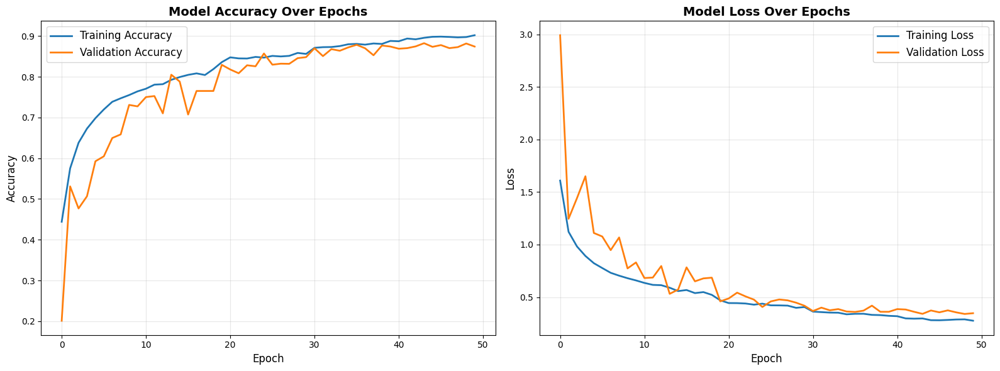

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy plot
axes[0].plot(history_cnn.history['accuracy'], label='Training Accuracy', linewidth=2)
axes[0].plot(history_cnn.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title('Model Accuracy Over Epochs', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy', fontsize=12)
axes[0].legend(fontsize=12)
axes[0].grid(True, alpha=0.3)

# Loss plot
axes[1].plot(history_cnn.history['loss'], label='Training Loss', linewidth=2)
axes[1].plot(history_cnn.history['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title('Model Loss Over Epochs', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=12)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# **EVALUATE CUSTOM CNN MODEL**

In [20]:
print("\n" + "="*70)
print("EVALUATING CUSTOM CNN MODEL")
print("="*70)

# Evaluate on test set
test_loss, test_accuracy = model_cnn.evaluate(test_generator, verbose=1)
print(f"\n✓ Test Loss: {test_loss:.4f}")
print(f"✓ Test Accuracy: {test_accuracy*100:.2f}%")

# Predictions
test_generator.reset()
predictions = model_cnn.predict(test_generator, verbose=1)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = test_generator.classes
class_labels = list(test_generator.class_indices.keys())

# Classification Report
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


EVALUATING CUSTOM CNN MODEL
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy: 0.9039 - loss: 0.2924

✓ Test Loss: 0.3044
✓ Test Accuracy: 89.70%
94/94 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step

CLASSIFICATION REPORT
              precision    recall  f1-score   support

   buildings       0.90      0.89      0.90       437
      forest       0.98      0.98      0.98       474
     glacier       0.86      0.84      0.85       553
    mountain       0.86      0.85      0.85       525
         sea       0.89      0.90      0.90       510
      street       0.90      0.92      0.91       501

    accuracy                           0.90      3000
   macro avg       0.90      0.90      0.90      3000
weighted avg       0.90      0.90      0.90      3000



# VISUALIZATION 6: Confusion Matrix

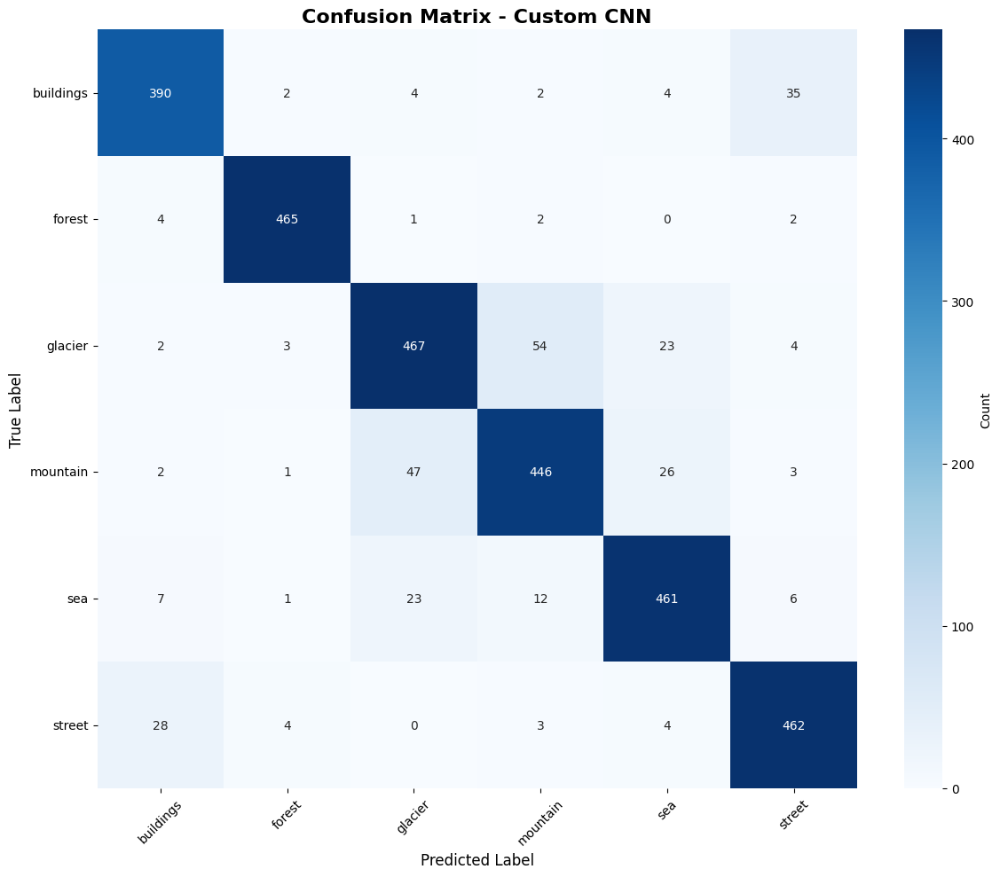

In [21]:
cm = confusion_matrix(true_classes, predicted_classes)

plt.figure(figsize=(12, 10))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels,
            cbar_kws={'label': 'Count'})
plt.title('Confusion Matrix - Custom CNN', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


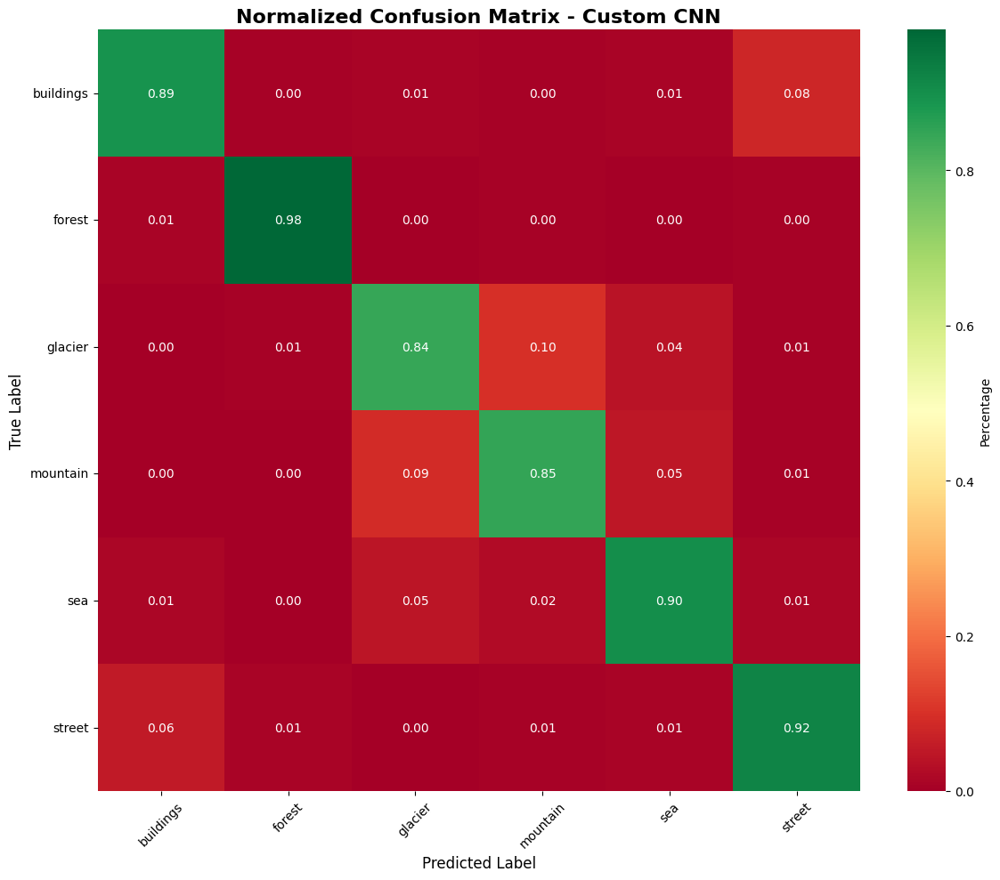

In [22]:
# Normalized confusion matrix
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

plt.figure(figsize=(12, 10))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='RdYlGn',
            xticklabels=class_labels, yticklabels=class_labels,
            cbar_kws={'label': 'Percentage'})
plt.title('Normalized Confusion Matrix - Custom CNN', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# **TRANSFER LEARNING - EFFICIENTNET**

In [23]:
print("\n" + "="*70)
print("BUILDING TRANSFER LEARNING MODEL - EFFICIENTNET")
print("="*70)

def create_transfer_model():
    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)
    )

    # Freeze base model layers
    base_model.trainable = False

    # Create new model
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(len(classes), activation='softmax')
    ])

    return model

# Create transfer learning model
model_transfer = create_transfer_model()

# Compile
model_transfer.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model_transfer.summary())


BUILDING TRANSFER LEARNING MODEL - EFFICIENTNET
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)     │ (None, 5, 5, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_10          │ (None, 1280)           │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 512)            │       655,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_11          │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_12          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,846,505 (18.49 MB)

 Trainable params: 792,838 (3.02 MB)

 Non-trainable params: 4,053,667 (15.46 MB)

None


# **TRAIN TRANSFER LEARNING MODEL**

In [24]:
print("\n" + "="*70)
print("TRAINING TRANSFER LEARNING MODEL")
print("="*70)

checkpoint_transfer = ModelCheckpoint(
    'best_model_transfer.h5',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

history_transfer = model_transfer.fit(
    train_generator,
    epochs=30,
    validation_data=validation_generator,
    callbacks=[early_stop, reduce_lr, checkpoint_transfer],
    verbose=1
)


TRAINING TRANSFER LEARNING MODEL
Epoch 1/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 207ms/step - accuracy: 0.1782 - loss: 2.3264
Epoch 1: val_accuracy improved from -inf to 0.17903, saving model to best_model_transfer.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 129s 292ms/step - accuracy: 0.1782 - loss: 2.3259 - val_accuracy: 0.1790 - val_loss: 1.8492 - learning_rate: 0.0010
Epoch 2/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.1949 - loss: 1.9231
Epoch 2: val_accuracy improved from 0.17903 to 0.20364, saving model to best_model_transfer.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.1949 - loss: 1.9231 - val_accuracy: 0.2036 - val_loss: 1.7749 - learning_rate: 0.0010
Epoch 3/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.2069 - loss: 1.8335
Epoch 3: val_accuracy did not improve from 0.20364
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.2069 - loss: 1.8334 - val_accuracy: 0.1947 - val_loss: 1.7826 - learning_rate: 0.0010
Epoch 4/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.2219 - loss: 1.7661
Epoch 4: val_accuracy did not improve from 0.20364
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.2219 - loss: 1.7661 - val_accuracy: 0.2033 - val_loss: 1.7661 - learning_rate: 0.0010
Epoch 5/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.2306 - loss: 1.7440
Epoch 5: val_accuracy did not improve from 0.20364
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.2306 - loss: 1.7440 - val_accuracy: 0.2036 - val_loss: 1.7574 - learning_rate: 0.0010
Epoch 6

351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 205ms/step - accuracy: 0.2304 - loss: 1.7257 - val_accuracy: 0.2076 - val_loss: 1.7940 - learning_rate: 0.0010
Epoch 7/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.2400 - loss: 1.7022
Epoch 7: val_accuracy improved from 0.20756 to 0.21683, saving model to best_model_transfer.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 206ms/step - accuracy: 0.2400 - loss: 1.7022 - val_accuracy: 0.2168 - val_loss: 1.7331 - learning_rate: 0.0010
Epoch 8/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.2404 - loss: 1.7067
Epoch 8: val_accuracy did not improve from 0.21683
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 205ms/step - accuracy: 0.2404 - loss: 1.7067 - val_accuracy: 0.2097 - val_loss: 1.8314 - learning_rate: 0.0010
Epoch 9/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.2414 - loss: 1.6926
Epoch 9: val_accuracy improved from 0.21683 to 0.25321, saving model to best_model_transfer.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 205ms/step - accuracy: 0.2414 - loss: 1.6926 - val_accuracy: 0.2532 - val_loss: 1.7247 - learning_rate: 0.0010
Epoch 10/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - accuracy: 0.2411 - loss: 1.6935
Epoch 10: val_accuracy did not improve from 0.25321
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.2411 - loss: 1.6935 - val_accuracy: 0.2504 - val_loss: 1.7173 - learning_rate: 0.0010
Epoch 11/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.2546 - loss: 1.6925
Epoch 11: val_accuracy did not improve from 0.25321
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.2545 - loss: 1.6925 - val_accuracy: 0.2061 - val_loss: 1.7869 - learning_rate: 0.0010
Epoch 12/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.2532 - loss: 1.6854
Epoch 12: val_accuracy did not improve from 0.25321
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.2532 - loss: 1.6854 - val_accuracy: 0.2361 - val_loss: 1.6797 - learning_rate: 0.0010
E

351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.2582 - loss: 1.6818 - val_accuracy: 0.2657 - val_loss: 1.6523 - learning_rate: 0.0010
Epoch 14/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - accuracy: 0.2538 - loss: 1.6689
Epoch 14: val_accuracy improved from 0.26569 to 0.27211, saving model to best_model_transfer.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 203ms/step - accuracy: 0.2538 - loss: 1.6689 - val_accuracy: 0.2721 - val_loss: 1.6682 - learning_rate: 0.0010
Epoch 15/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - accuracy: 0.2637 - loss: 1.6700
Epoch 15: val_accuracy did not improve from 0.27211
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 205ms/step - accuracy: 0.2637 - loss: 1.6700 - val_accuracy: 0.2703 - val_loss: 1.6466 - learning_rate: 0.0010
Epoch 16/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.2661 - loss: 1.6627
Epoch 16: val_accuracy improved from 0.27211 to 0.27389, saving model to best_model_transfer.h5


351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 205ms/step - accuracy: 0.2661 - loss: 1.6626 - val_accuracy: 0.2739 - val_loss: 1.6386 - learning_rate: 0.0010
Epoch 17/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.2720 - loss: 1.6505
Epoch 17: val_accuracy did not improve from 0.27389
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.2720 - loss: 1.6505 - val_accuracy: 0.2247 - val_loss: 1.6845 - learning_rate: 0.0010
Epoch 18/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - accuracy: 0.2712 - loss: 1.6553
Epoch 18: val_accuracy did not improve from 0.27389
351/351 ━━━━━━━━━━━━━━━━━━━━ 73s 207ms/step - accuracy: 0.2712 - loss: 1.6553 - val_accuracy: 0.2379 - val_loss: 1.7009 - learning_rate: 0.0010
Epoch 19/30
351/351 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.2767 - loss: 1.6468
Epoch 19: val_accuracy did not improve from 0.27389
351/351 ━━━━━━━━━━━━━━━━━━━━ 72s 204ms/step - accuracy: 0.2767 - loss: 1.6468 - val_accuracy: 0.2685 - val_loss: 1.6642 - learning_rate: 0.0010
E

# VISUALIZATION 7: Transfer Learning Training History

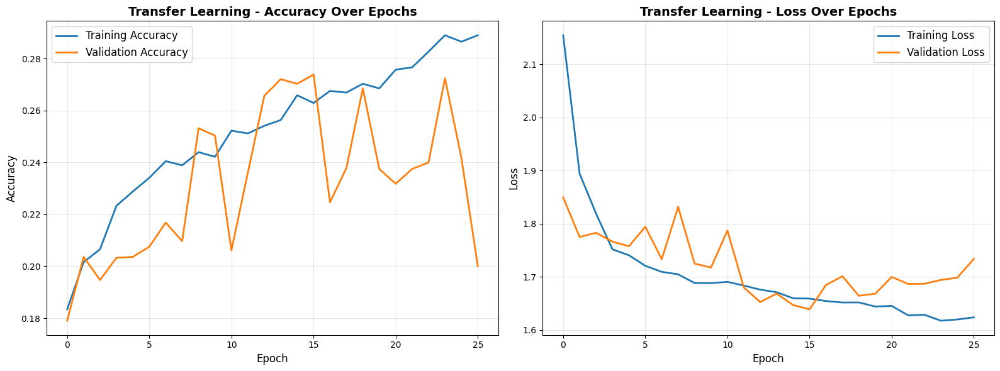

In [25]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy plot
axes[0].plot(history_transfer.history['accuracy'], label='Training Accuracy', linewidth=2)
axes[0].plot(history_transfer.history['val_accuracy'], label='Validation Accuracy', linewidth=2)
axes[0].set_title('Transfer Learning - Accuracy Over Epochs', fontsize=14, fontweight='bold')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Accuracy', fontsize=12)
axes[0].legend(fontsize=12)
axes[0].grid(True, alpha=0.3)

# Loss plot
axes[1].plot(history_transfer.history['loss'], label='Training Loss', linewidth=2)
axes[1].plot(history_transfer.history['val_loss'], label='Validation Loss', linewidth=2)
axes[1].set_title('Transfer Learning - Loss Over Epochs', fontsize=14, fontweight='bold')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss', fontsize=12)
axes[1].legend(fontsize=12)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# **EVALUATE TRANSFER LEARNING MODEL**

In [26]:
print("\n" + "="*70)
print("EVALUATING TRANSFER LEARNING MODEL")
print("="*70)

# Evaluate on test set
test_loss_transfer, test_accuracy_transfer = model_transfer.evaluate(test_generator, verbose=1)
print(f"\n✓ Test Loss: {test_loss_transfer:.4f}")
print(f"✓ Test Accuracy: {test_accuracy_transfer*100:.2f}%")

# Predictions
test_generator.reset()
predictions_transfer = model_transfer.predict(test_generator, verbose=1)
predicted_classes_transfer = np.argmax(predictions_transfer, axis=1)

# Classification Report
print("\n" + "="*70)
print("CLASSIFICATION REPORT - TRANSFER LEARNING")
print("="*70)
print(classification_report(true_classes, predicted_classes_transfer, target_names=class_labels))



EVALUATING TRANSFER LEARNING MODEL
94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 121ms/step - accuracy: 0.2762 - loss: 1.5982

✓ Test Loss: 1.5594
✓ Test Accuracy: 35.43%
94/94 ━━━━━━━━━━━━━━━━━━━━ 14s 86ms/step

CLASSIFICATION REPORT - TRANSFER LEARNING
              precision    recall  f1-score   support

   buildings       0.55      0.24      0.34       437
      forest       1.00      0.00      0.00       474
     glacier       0.28      0.62      0.38       553
    mountain       0.39      0.59      0.47       525
         sea       0.00      0.00      0.00       510
      street       0.38      0.60      0.47       501

    accuracy                           0.35      3000
   macro avg       0.43      0.34      0.28      3000
weighted avg       0.42      0.35      0.28      3000



# VISUALIZATION 8: Confusion Matrix - Transfer Learning

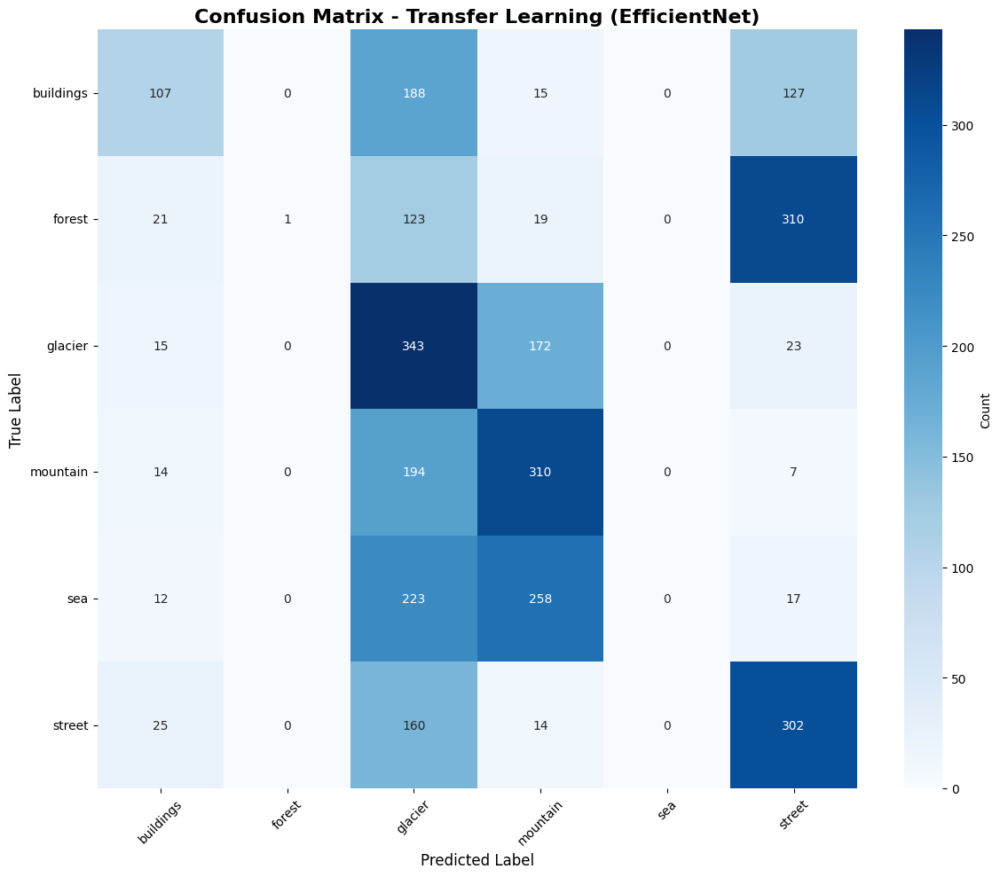

In [27]:
cm_transfer = confusion_matrix(true_classes, predicted_classes_transfer)

plt.figure(figsize=(12, 10))
sns.heatmap(cm_transfer, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_labels, yticklabels=class_labels,
            cbar_kws={'label': 'Count'})
plt.title('Confusion Matrix - Transfer Learning (EfficientNet)', fontsize=16, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12)
plt.ylabel('True Label', fontsize=12)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# **MODEL COMPARISON**


MODEL COMPARISON
                              Model  Test Accuracy  Test Loss
0                        Custom CNN      89.700001   0.304381
1  Transfer Learning (EfficientNet)      35.433334   1.559403


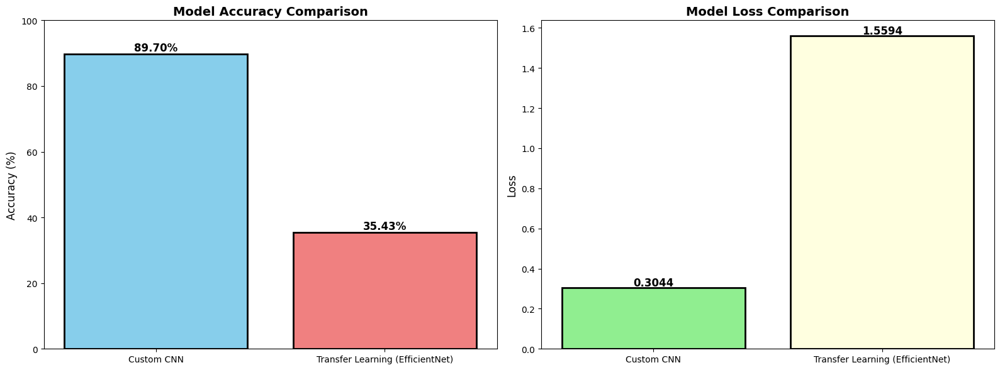

In [28]:
print("\n" + "="*70)
print("MODEL COMPARISON")
print("="*70)

comparison_df = pd.DataFrame({
    'Model': ['Custom CNN', 'Transfer Learning (EfficientNet)'],
    'Test Accuracy': [test_accuracy*100, test_accuracy_transfer*100],
    'Test Loss': [test_loss, test_loss_transfer]
})

print(comparison_df)

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Accuracy comparison
axes[0].bar(comparison_df['Model'], comparison_df['Test Accuracy'],
            color=['skyblue', 'lightcoral'], edgecolor='black', linewidth=2)
axes[0].set_title('Model Accuracy Comparison', fontsize=14, fontweight='bold')
axes[0].set_ylabel('Accuracy (%)', fontsize=12)
axes[0].set_ylim([0, 100])
for i, v in enumerate(comparison_df['Test Accuracy']):
    axes[0].text(i, v + 1, f'{v:.2f}%', ha='center', fontweight='bold', fontsize=12)

# Loss comparison
axes[1].bar(comparison_df['Model'], comparison_df['Test Loss'],
            color=['lightgreen', 'lightyellow'], edgecolor='black', linewidth=2)
axes[1].set_title('Model Loss Comparison', fontsize=14, fontweight='bold')
axes[1].set_ylabel('Loss', fontsize=12)
for i, v in enumerate(comparison_df['Test Loss']):
    axes[1].text(i, v + 0.01, f'{v:.4f}', ha='center', fontweight='bold', fontsize=12)

plt.tight_layout()
plt.show()

# **PREDICTION ON NEW IMAGES**


MAKING PREDICTIONS ON NEW IMAGES


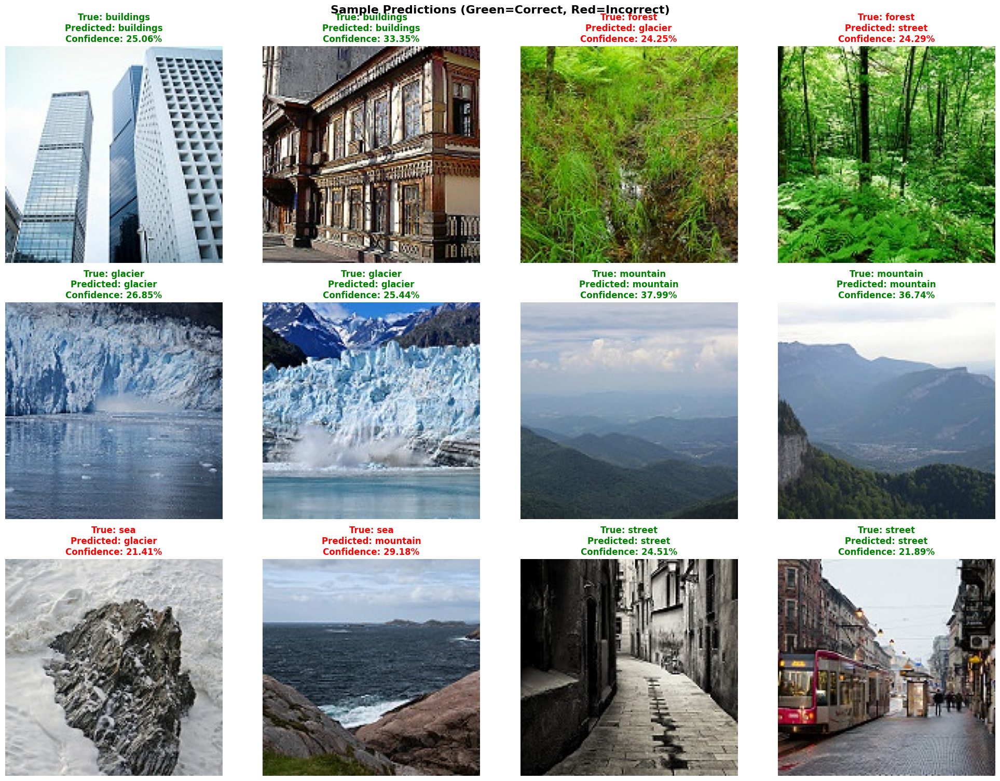

In [29]:
print("\n" + "="*70)
print("MAKING PREDICTIONS ON NEW IMAGES")
print("="*70)

def predict_image(img_path, model):
    img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = img_array / 255.0

    prediction = model.predict(img_array, verbose=0)
    predicted_class = class_labels[np.argmax(prediction)]
    confidence = np.max(prediction) * 100

    return predicted_class, confidence

# Sample predictions from test set
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
axes = axes.ravel()

sample_images = []
for class_name in classes:
    class_path = os.path.join(test_dir, class_name)
    sample_images.extend(glob(os.path.join(class_path, '*.jpg'))[:2])

for idx, img_path in enumerate(sample_images[:12]):
    # Use best model (transfer learning)
    predicted_class, confidence = predict_image(img_path, model_transfer)
    true_class = os.path.basename(os.path.dirname(img_path))

    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    axes[idx].imshow(img)

    color = 'green' if predicted_class == true_class else 'red'
    axes[idx].set_title(f'True: {true_class}\nPredicted: {predicted_class}\nConfidence: {confidence:.2f}%',
                        fontsize=12, fontweight='bold', color=color)
    axes[idx].axis('off')

plt.tight_layout()
plt.suptitle('Sample Predictions (Green=Correct, Red=Incorrect)',
             fontsize=16, fontweight='bold', y=1.001)
plt.show()

# **CLASS-WISE ACCURACY**


CLASS-WISE ACCURACY ANALYSIS
buildings: 24.49%
forest: 0.21%
glacier: 62.03%
mountain: 59.05%
sea: 0.00%
street: 60.28%


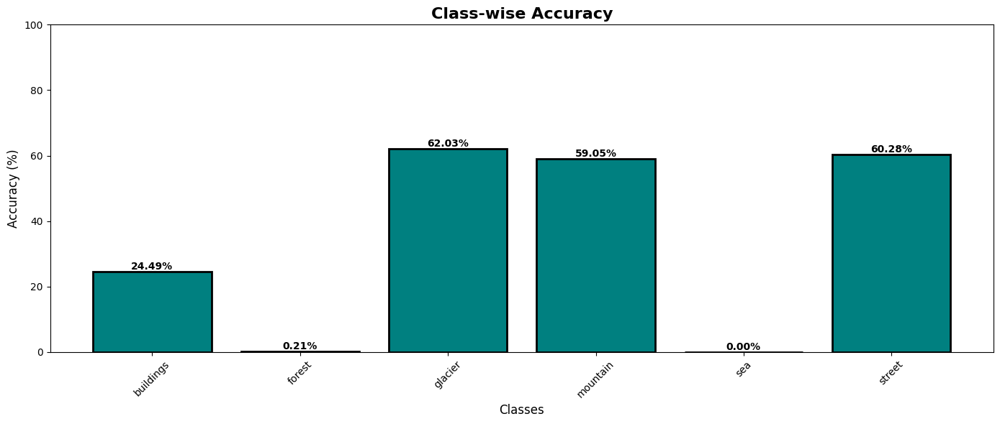

In [30]:
print("\n" + "="*70)
print("CLASS-WISE ACCURACY ANALYSIS")
print("="*70)

from sklearn.metrics import accuracy_score

class_wise_accuracy = []
for i, class_name in enumerate(class_labels):
    class_indices = np.where(true_classes == i)[0]
    class_predictions = predicted_classes_transfer[class_indices]
    class_true = true_classes[class_indices]
    class_acc = accuracy_score(class_true, class_predictions) * 100
    class_wise_accuracy.append(class_acc)
    print(f"{class_name}: {class_acc:.2f}%")

# Visualization
plt.figure(figsize=(14, 6))
bars = plt.bar(class_labels, class_wise_accuracy, color='teal', edgecolor='black', linewidth=2)
plt.title('Class-wise Accuracy', fontsize=16, fontweight='bold')
plt.xlabel('Classes', fontsize=12)
plt.ylabel('Accuracy (%)', fontsize=12)
plt.ylim([0, 100])
plt.xticks(rotation=45)

# Add value labels
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
             f'{height:.2f}%', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.show()